# Direct Data Access

## Summary  

In [Data Discovery](Data_Discovery.ipynb), we searched for and generated HTTPS and S3 links for HLS data. In this notebook, we'll:
- Import .tif files representing captured band data from the S3 links in a single region
- Extract multiple spectra bands from the S3 links
- Manipulate them into a normalized difference snow index (NDSI)
- Visualize the region mapped by the bands
- Import lidar data as a base truth
- Project the HLS regions and the lidar regions to match
- Test the accuracy of NDSI on this region by computing F1 scores


***

## Import Required Packages

In [65]:
import sys
print(sys.version)
# !{sys.executable} -m pip list

3.11.8 | packaged by conda-forge | (main, Feb 16 2024, 20:53:32) [GCC 12.3.0]


<img src='data:image/png;base64,iVBORw0KGgoAAAANSUhEUgAAAEAAAABACAYAAACqaXHeAAAABHNCSVQICAgIfAhkiAAAAAlwSFlz
AAAB+wAAAfsBxc2miwAAABl0RVh0U29mdHdhcmUAd3d3Lmlua3NjYXBlLm9yZ5vuPBoAAA6zSURB
VHic7ZtpeFRVmsf/5966taWqUlUJ2UioBBJiIBAwCZtog9IOgjqACsogKtqirT2ttt069nQ/zDzt
tI4+CrJIREFaFgWhBXpUNhHZQoKBkIUASchWla1S+3ar7r1nPkDaCAnZKoQP/D7mnPOe9/xy76n3
nFSAW9ziFoPFNED2LLK5wcyBDObkb8ZkxuaoSYlI6ZcOKq1eWFdedqNzGHQBk9RMEwFAASkk0Xw3
ETacDNi2vtvc7L0ROdw0AjoSotQVkKSvHQz/wRO1lScGModBFbDMaNRN1A4tUBCS3lk7BWhQkgpD
lG4852/+7DWr1R3uHAZVQDsbh6ZPN7CyxUrCzJMRouusj0ipRwD2uKm0Zn5d2dFwzX1TCGhnmdGo
G62Nna+isiUqhkzuKrkQaJlPEv5mFl2fvGg2t/VnzkEV8F5ioioOEWkLG86fvbpthynjdhXYZziQ
x1hC9J2NFyi8vCTt91Fh04KGip0AaG9zuCk2wQCVyoNU3Hjezee9bq92duzzTmxsRJoy+jEZZZYo
GTKJ6SJngdJqAfRzpze0+jHreUtPc7gpBLQnIYK6BYp/uGhw9YK688eu7v95ysgshcg9qSLMo3JC
4jqLKQFBgdKDPoQ+Pltb8dUyQLpeDjeVgI6EgLIQFT5tEl3rn2losHVsexbZ3EyT9wE1uGdkIPcy
BGxn8QUq1QrA5nqW5i2tLqvrrM9NK6AdkVIvL9E9bZL/oyfMVd/jqvc8LylzRBKDJSzIExwhQzuL
QYGQj4rHfFTc8mUdu3E7yoLtbTe9gI4EqVgVkug2i5+uXGo919ixbRog+3fTbQ8qJe4ZOYNfMoTI
OoshUNosgO60AisX15aeI2PSIp5KiFLI9ubb1vV3Qb2ltwLakUCDAkWX7/nHKRmmGIl9VgYsUhJm
2NXjKYADtM1ygne9QQDIXlk49FBstMKx66D1v4+XuQr7vqTe0VcBHQlRWiOCbmmSYe2SqtL6q5rJ
zsTb7lKx3FKOYC4DoqyS/B5bvLPxvD9Qtf6saxYLQGJErmDOdOMr/zo96km1nElr8bmPOBwI9COv
HnFPRIwmkSOv9kcAS4heRsidOkpeWBgZM+UBrTFAXNYL5Vf2ii9c1trNzpYdaoVil3WIc+wdk+gQ
noie3ecCcxt9ITcLAPWt/laGEO/9U6PmzZkenTtsSMQ8uYywJVW+grCstAvCIaAdArAsIWkRDDs/
KzLm2YcjY1Lv0UdW73HabE9n6V66cxSzfEmuJssTpKGVp+0vHq73FwL46eOjpMpbRAnNmJFrGJNu
Ukf9Yrz+3rghiumCKNXXWPhLYcjxGsIpoCMsIRoFITkW8AuyM8jC1+/QLx4bozCEJIq38+1rtpR6
V/yzb8eBlRb3fo5l783N0CWolAzJHaVNzkrTzlEp2bQ2q3TC5gn6wpnoQAmwSiGh2GitnTmVMc5O
UyfKWUKCIsU7+fZDKwqdT6DDpvkzAX4/+AMFjk0tDp5GRXLpQ2MUmhgDp5gxQT8+Y7hyPsMi8uxF
71H0oebujHALECjFKaW9Lm68n18wXp2kVzIcABytD5iXFzg+WVXkegpAsOOYziqo0OkK76GyquC3
ltZAzMhhqlSNmmWTE5T6e3IN05ITFLM4GdN0vtZ3ob8Jh1NAKXFbm5PtLU/eqTSlGjkNAJjdgn/N
aedXa0tdi7+t9G0FIF49rtMSEgAs1kDLkTPO7ebm4IUWeyh1bKomXqlgMG6kJmHcSM0clYLJ8XtR
1GTnbV3F6I5wCGikAb402npp1h1s7LQUZZSMIfALFOuL3UUrfnS8+rez7v9qcold5tilgHbO1fjK
9ubb17u9oshxzMiUBKXWqJNxd+fqb0tLVs4lILFnK71H0Ind7uiPgACVcFJlrb0tV6DzxqqTIhUM
CwDf1/rrVhTa33/3pGPxJYdQ2l2cbgVcQSosdx8uqnDtbGjh9SlDVSMNWhlnilfqZk42Th2ZpLpf
xrHec5e815zrr0dfBZSwzkZfqsv+1FS1KUknUwPARVvItfKUY+cn57yP7qv07UE3p8B2uhUwLk09
e0SCOrK+hbdYHYLjRIl71wWzv9jpEoeOHhGRrJAzyEyNiJuUqX0g2sBN5kGK6y2Blp5M3lsB9Qh4
y2Ja6x6+i0ucmKgwMATwhSjdUu49tKrQ/pvN5d53ml2CGwCmJipmKjgmyuaXzNeL2a0AkQ01Th5j
2DktO3Jyk8f9vcOBQHV94OK+fPumJmvQHxJoWkaKWq9Vs+yUsbq0zGT1I4RgeH2b5wef7+c7bl8F
eKgoHVVZa8ZPEORzR6sT1BzDUAD/d9F78e2Tzv99v8D+fLVTqAKAsbGamKey1Mt9Ann4eH3gTXTz
idWtAJ8PQWOk7NzSeQn/OTHDuEikVF1R4z8BQCy+6D1aWRfY0tTGG2OM8rRoPaeIj5ZHzJxszElN
VM8K8JS5WOfv8mzRnQAKoEhmt8gyPM4lU9SmBK1MCQBnW4KONT86v1hZ1PbwSXPw4JWussVjtH9Y
NCoiL9UoH/6PSu8jFrfY2t36erQHXLIEakMi1SydmzB31h3GGXFDFNPaK8Rme9B79Ixrd0WN+1ij
NRQ/doRmuFLBkHSTOm5GruG+pFjFdAmorG4IXH1Qua6ASniclfFtDYt+oUjKipPrCQB7QBQ2lrgP
fFzm+9XWUtcqJ3/5vDLDpJ79XHZk3u8nGZ42qlj1+ydtbxysCezrydp6ugmipNJ7WBPB5tydY0jP
HaVNzs3QzeE4ZpTbI+ZbnSFPbVOw9vsfnVvqWnirPyCNGD08IlqtYkh2hjZ5dErEQzoNm+6ykyOt
Lt5/PQEuSRRKo22VkydK+vvS1XEKlhCJAnsqvcVvH7f/ZU2R67eXbMEGAMiIV5oWZWiWvz5Fv2xG
sjqNJQRvn3Rs2lji/lNP19VjAQDgD7FHhujZB9OGqYxRkZxixgRDVlqS6uEOFaJUVu0rPFzctrnF
JqijImVp8dEKVWyUXDk92zAuMZ6bFwpBU1HrOw6AdhQgUooChb0+ItMbWJitSo5Ws3IAOGEOtL53
0vHZih9sC4vtofZ7Qu6523V/fmGcds1TY3V36pUsBwAbSlxnVh2xLfAD/IAIMDf7XYIkNmXfpp2l
18rkAJAy9HKFaIr/qULkeQQKy9zf1JgDB2uaeFNGijo5QsUyacNUUTOnGO42xSnv4oOwpDi1zYkc
efUc3I5Gk6PhyTuVKaOGyLUAYPGIoY9Pu/atL/L92+4q9wbflRJ2Trpm/jPjdBtfnqB/dIThcl8A
KG7hbRuKnb8qsQsVvVlTrwQAQMUlf3kwJI24Z4JhPMtcfng5GcH49GsrxJpGvvHIaeem2ma+KSjQ
lIwUdYyCY8j4dE1KzijNnIP2llF2wcXNnsoapw9XxsgYAl6k+KzUXbi2yP3KR2ecf6z3BFsBICdW
nvnIaG3eHybqX7vbpEqUMT+9OL4Qpe8VON7dXuFd39v19FoAABRVePbGGuXTszO0P7tu6lghUonE
llRdrhArLvmKdh9u29jcFiRRkfLUxBiFNiqSU9icoZQHo5mYBI1MBgBH6wMNb+U7Pnw337H4gi1Y
ciWs+uks3Z9fztUvfzxTm9Ne8XXkvQLHNytOOZeiD4e0PgkAIAYCYknKUNUDSXEKzdWNpnil7r4p
xqkjTarZMtk/K8TQ6Qve78qqvXurGwIJqcOUKfUWHsm8KGvxSP68YudXq4pcj39X49uOK2X142O0
Tz5/u/7TVybqH0rSya6ZBwD21/gubbrgWdDgEOx9W
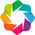

In [66]:
%matplotlib inline
import matplotlib.pyplot as plt
from datetime import datetime
import os
import requests
import boto3
import numpy as np
import xarray as xr
import rasterio as rio
from rasterio.session import AWSSession
from rasterio.plot import show
import rioxarray
import geoviews as gv
import hvplot.xarray
import holoviews as hv
gv.extension('bokeh', 'matplotlib')
%run -i 'data_names.py'

## Configure Local Environment and Get Temporary Credentials  

See [EarthdataLoginSetup.ipynb](EarthdataLoginSetup.ipynb) for a guide on how to set up your Earthdata login. We will use the .netrc file you made in that step to access the cloud data in this notebook.

In [67]:
s3_cred_endpoint = 'https://data.lpdaac.earthdatacloud.nasa.gov/s3credentials'

In [68]:
def get_temp_creds():
    temp_creds_url = s3_cred_endpoint
    return requests.get(temp_creds_url).json()

In [69]:
temp_creds_req = get_temp_creds()

### Insert the credentials into our `boto3` session and configure our `rasterio` environment for data access

Create a boto3 Session object using your temporary credentials. This Session is used to pass credentials and configuration to AWS so we can interact wit S3 objects from applicable buckets.

In [70]:
session = boto3.Session(aws_access_key_id=temp_creds_req['accessKeyId'], 
                        aws_secret_access_key=temp_creds_req['secretAccessKey'],
                        aws_session_token=temp_creds_req['sessionToken'],
                        region_name='us-west-2')

For this exercise, we are going to open up a context manager for the notebook using the `rasterio.env` module to store the required GDAL and AWS configurations we need to access the data in Earthdata Cloud. While the context manager is open (`rio_env.__enter__()`) we will be able to run the open or get  data commands that would typically be executed within a `with` statement, thus allowing us to more freely interact with the data. We’ll close the context (`rio_env.__exit__()`) at the end of the notebook.

GDAL environment variables must be configured to access Earthdata Cloud data assets. Geospatial data access Python packages like `rasterio` and `rioxarray` depend on GDAL, leveraging GDAL's "Virtual File Systems" to read remote files. GDAL has a lot of environment variables that control it's behavior. Changing these settings can mean the difference being able to access a file or not. They can also have an impact on the performance.

In [71]:
rio_env = rio.Env(AWSSession(session),
                  GDAL_DISABLE_READDIR_ON_OPEN='EMPTY_DIR',
                  GDAL_HTTP_COOKIEFILE=os.path.expanduser('~/cookies.txt'),
                  GDAL_HTTP_COOKIEJAR=os.path.expanduser('~/cookies.txt'))
rio_env.__enter__()

## Read in S3 Links

In [Data Discovery](Data_Discovery.ipynb) tutorial we saved off multiple text file containing links, both HTTPS and S3 links, to Harmonized Landsat Sentinel-2 (HLS) cloud data assets. We will now read in one of those file and show how to access those data assets.

### List the available files in the data directory

**NOTE:** If you are running the notebook from the tutorials-templates directory, please use the following path to connect to the data directoy: "**../tutorials/data**"

In [72]:
[f for f in os.listdir('../data') if '.txt' in f]

['HTTPS_T11SLC_B03_Links.txt',
 'HTTPS_T11SLB_B04_Links.txt',
 'S3_T11SLC_B06_Links.txt',
 'HTTPS_T11SLB_B11_Links.txt',
 'HTTPS_T11SLB_B02_Links.txt',
 'S3_T11SLB_B03_Links.txt',
 'HTTPS_T11SLB_B06_Links.txt',
 'S3_T11SLC_B11_Links.txt',
 'S3_T11SLB_B06_Links.txt',
 'S3_T11SLB_B02_Links.txt',
 'S3_T11SLB_B11_Links.txt',
 'HTTPS_T11SLC_B11_Links.txt',
 'HTTPS_T11SLB_B03_Links.txt',
 'S3_T11SLC_B03_Links.txt',
 'S3_T11SLB_B04_Links.txt',
 'HTTPS_T11SLC_B06_Links.txt']

The HLS is split between two sources: Landsat and Sentinel. You can determine which links line up with which bands by matching from [here](https://lpdaac.usgs.gov/data/get-started-data/collection-overview/missions/harmonized-landsat-sentinel-2-hls-overview/#hls-spectral-bands).

In [73]:
links = {}
links["02"] = [f's3://lp-prod-protected/HLSS30.020/{region}/{region}.B02.tif']
links["03"] = [f's3://lp-prod-protected/HLSS30.020/{region}/{region}.B03.tif']
links["04"] = [f's3://lp-prod-protected/HLSS30.020/{region}/{region}.B04.tif']
links["11"] = [f's3://lp-prod-protected/HLSS30.020/{region}/{region}.B11.tif']
links["lidar"] = f'../data/{lidar_name}.tif'
# links["02"] = open('../data/S3_T11SLB_B02_Links.txt').read().splitlines() # L30 and S30 for BLUE
# links["03"] = open('../data/S3_T11SLB_B03_Links.txt').read().splitlines() # L30 and S30 for GREEN
# links["04"] = open('../data/S3_T11SLB_B04_Links.txt').read().splitlines() # L30 and S30 for RED
# links["06"] = open('../data/S3_T11SLB_B06_Links.txt').read().splitlines() # L30 for (Shortwave Infrared) SWIR 1
# links["11"] = open('../data/S3_T11SLB_B11_Links.txt').read().splitlines() # S30 for SWIR 1
links

{'02': ['s3://lp-prod-protected/HLSS30.020/HLS.S30.T10TEL.2023114T184919.v2.0/HLS.S30.T10TEL.2023114T184919.v2.0.B02.tif'],
 '03': ['s3://lp-prod-protected/HLSS30.020/HLS.S30.T10TEL.2023114T184919.v2.0/HLS.S30.T10TEL.2023114T184919.v2.0.B03.tif'],
 '04': ['s3://lp-prod-protected/HLSS30.020/HLS.S30.T10TEL.2023114T184919.v2.0/HLS.S30.T10TEL.2023114T184919.v2.0.B04.tif'],
 '11': ['s3://lp-prod-protected/HLSS30.020/HLS.S30.T10TEL.2023114T184919.v2.0/HLS.S30.T10TEL.2023114T184919.v2.0.B11.tif'],
 'lidar': '../data/ASO_SacramentoMcCloud_2023Apr24-25_snowdepth_50m.tif'}

You can tell break down a given link based on its' folder path and name.

In [74]:
for k in links.keys():
    print(links[k][0])

s3://lp-prod-protected/HLSS30.020/HLS.S30.T10TEL.2023114T184919.v2.0/HLS.S30.T10TEL.2023114T184919.v2.0.B02.tif
s3://lp-prod-protected/HLSS30.020/HLS.S30.T10TEL.2023114T184919.v2.0/HLS.S30.T10TEL.2023114T184919.v2.0.B03.tif
s3://lp-prod-protected/HLSS30.020/HLS.S30.T10TEL.2023114T184919.v2.0/HLS.S30.T10TEL.2023114T184919.v2.0.B04.tif
s3://lp-prod-protected/HLSS30.020/HLS.S30.T10TEL.2023114T184919.v2.0/HLS.S30.T10TEL.2023114T184919.v2.0.B11.tif
.


Take s3://lp-prod-protected/HLSS30.020/HLS.S30.T11SLB.2019182T183929.v2.0/HLS.S30.T11SLB.2019182T183929.v2.0.B02.tif for example.
- HLS indicates it's from the HLS (a good sanity check)
- S30 indicates it's data from Sentinel (not Landsat, which is L30)
- T11SLB is the tile region, which matches with what you found on Sentinel Hub
- 2019182 means that the data was captured on the 182nd day of 2019. I reccomend using an online tool to convert that to calendar dates
- This is speculation, but I think T183929 is a time signature during the day. I haven't figured out how to parse it.
- At the end, you'll see what band it is. Once again, see [here](https://lpdaac.usgs.gov/data/get-started-data/collection-overview/missions/harmonized-landsat-sentinel-2-hls-overview/#hls-spectral-bands) for refernece.


## Read in a single HLS file

We'll access the HLS S3 object using the [`rioxarray`](https://corteva.github.io/rioxarray/stable/) Python package. The package is an extension of `xarray` and `rasterio`, allowing users to read in and interact with geospatial data using xarray data structures. We will also be leveraging the tight integration between xarray and dask to lazily read in data via the `chunks` parameter. This allows us to connect to the HLS S3 object, reading only metadata, an not load the data into memory until we request it via the `loads()` function. 

The process for finding which link to open is a painful one, because you just have to look through which links happened at the same time to match them together. This could likely be automated since the links have standard formatting, but this script is small enough to not matter.

In [75]:
def init():
    hls_bands = {}
    
    hls_bands["S02"] = rioxarray.open_rasterio(links["02"][0], chuncks=True).squeeze('band', drop=True)
    hls_bands["S03"] = rioxarray.open_rasterio(links["03"][0], chuncks=True).squeeze('band', drop=True)
    hls_bands["S04"] = rioxarray.open_rasterio(links["04"][0], chuncks=True).squeeze('band', drop=True)
    hls_bands["S11"] = rioxarray.open_rasterio(links["11"][0], chuncks=True).squeeze('band', drop=True)
    
    attrs = hls_bands["S03"].attrs
    
    # hls_bands["S02"] = rioxarray.open_rasterio(links["02"][i02], chuncks=True)
    # hls_bands["S03"] = rioxarray.open_rasterio(links["03"][i03], chuncks=True)
    # hls_bands["S04"] = rioxarray.open_rasterio(links["04"][i04], chuncks=True)
    # hls_bands["S11"] = rioxarray.open_rasterio(links["11"][i11], chuncks=True)
    
    # hls_bands["L02"] = rioxarray.open_rasterio(links["02"][2], chuncks=True).squeeze('band', drop=True)
    # hls_bands["L03"] = rioxarray.open_rasterio(links["03"][2], chuncks=True).squeeze('band', drop=True)
    # hls_bands["L04"] = rioxarray.open_rasterio(links["04"][2], chuncks=True).squeeze('band', drop=True)
    # hls_bands["L06"] = rioxarray.open_rasterio(links["06"][0], chuncks=True).squeeze('band', drop=True)
    
    lidar = rioxarray.open_rasterio(links["lidar"], chuncks=True).squeeze('band', drop=True)
    lidar = lidar.where(-100 < lidar, drop=True)
    return hls_bands, attrs, lidar
hls_bands, attrs, lidar = init()

In [76]:
hls_S02 = hls_bands["S02"]
hls_S03 = hls_bands["S03"]
hls_S04 = hls_bands["S04"]
hls_S11 = hls_bands["S11"]

When GeoTIFFS/Cloud Optimized GeoTIFFS are read in, a `band` coordinate variable is automatically created (see the print out above). In this exercise we will not use that coordinate variable, so we will remove it using the `squeeze()` function to avoid confusion. 

### Calculating an NDSI
The formula for the NDSI is (Green - SWIR1) / (Green + SWIR1). The NDSI outputs a probability (sort of) map of a pixel being snow.

We filter above a 40% chance of being snow, and then < 200% for weird normalization reasons (otherwise, the bounds are all off).

We cut to the lower left corner of the image for the sake of computational lightness.

Then we display.

We do this process for both the Landsat and Sentinel bands.

In [77]:
NDSI = (hls_S03 - hls_S11)/(hls_S03 + hls_S11)
thresholded = NDSI.where(.4 < NDSI)
thresholded = thresholded.where(thresholded < 1)
# thresholded = thresholded[1830:, :1830]
thresholded.hvplot.image(x='x', y='y', cmap='coolwarm', rasterize=True, width=800, height=600, colorbar=True)
# colormaps -> https://holoviews.org/user_guide/Colormaps.html

:DynamicMap   []
   :Image   [x,y]   (value)

In [78]:
# NDSI = (hls_L03 - hls_L06)/(hls_L03 + hls_L06)
# thresholded = NDSI.where(0.4 < NDSI)
# thresholded = thresholded[1830:, :1830]
# thresholded.hvplot.image(x='x', y='y', cmap='coolwarm', rasterize=True, width=800, height=600, colorbar=True)
# # colormaps -> https://holoviews.org/user_guide/Colormaps.html

### Displaying a color map
Combine the red, green, and blue bands to form a 3 x h x w tensor, a commonly used data format for color images, normalize the values, and then display.

In order to get the color map to display properly, I found that I needed these libraries added to cryocloud

In [79]:
# !pip install selenium
# !conda install -y -c conda-forge firefox geckodriver

In [80]:
# s_rgb = xr.concat([hls_S04, hls_S03, hls_S02], dim='color')
# print(s_rgb.shape)
# print(s_rgb)
# s_rgb = s_rgb / (s_rgb.max())

# s_rgb = s_rgb.transpose("y", "x", "color").values

# print(s_rgb.shape)
# image = hv.RGB(s_rgb, bounds=(0, 0, 3660, 3660))
# image.opts(frame_width=800, frame_height=800)
# # hv.extension('matplotlib')
# # hv.output(fig='png')
# # image

A color image for Landsat is omitted because it looks basically the same and these take forever to compute.

In [81]:
# l_rgb = xr.concat([hls_L04, hls_L03, hls_L02], dim='color')
# # print(rgb.shape)
# # print(rgb)
# l_rgb = l_rgb / l_rgb.max()

# l_rgb = l_rgb.transpose("y", "x", "color").values

# image = hv.RGB(l_rgb)
# # hv.extension('matplotlib')
# hv.output(fig='png')
# image

### Importing Lidar Data
To downlaod the lidar .tif, you have to find a similar region to the one captured in the HLS data in one of the sources specified in the README and manually download it.

We begin by starting off with the same importing process as the HLS bands. The lidar data uses a large negative number (-9999) to denote that it doesn't have data for that region, so we need to filter all values that are too low.

In [82]:
lidar = rioxarray.open_rasterio(links["lidar"], chuncks=True).squeeze('band', drop=True)
print(lidar)
lidar.hvplot.image(x='x', y='y', cmap='coolwarm', rasterize=True, width=800, height=600, colorbar=True)

<xarray.DataArray (y: 1818, x: 1461)> Size: 11MB
[2656098 values with dtype=float32]
Coordinates:
  * x            (x) float64 12kB 5.379e+05 5.38e+05 ... 6.109e+05 6.109e+05
  * y            (y) float64 15kB 4.597e+06 4.597e+06 ... 4.507e+06 4.507e+06
    spatial_ref  int64 8B 0
Attributes:
    AREA_OR_POINT:  Area
    Band_1:         Band 1
    _FillValue:     -9999.0
    scale_factor:   1.0
    add_offset:     0.0


:DynamicMap   []
   :Image   [x,y]   (value)

The lidar data has values of depth in meters. We consider anything with more than 1 cm of snow as "snow covered", so we filter off of 0

In [97]:
reproj_lidar = lidar.rio.reproject_match(hls_bands["S03"])

def print_raster(raster):
    print(
        f"shape: {raster.rio.shape}\n"
        f"resolution: {raster.rio.resolution()}\n"
        f"bounds: {raster.rio.bounds()}\n"
        f"sum: {raster.sum().item()}\n"
        f"CRS: {raster.rio.crs}\n"
    )

print_raster(reproj_lidar)
reproj_lidar = reproj_lidar.where(0.1 < reproj_lidar)
reproj_lidar.hvplot.image(x='x', y='y', cmap='coolwarm', rasterize=True, width=800, height=600, colorbar=True)

shape: (3660, 3660)
resolution: (30.0, -30.0)
bounds: (499980.0, 4490220.0, 609780.0, 4600020.0)
sum: -61347987456.0
CRS: EPSG:32610



:DynamicMap   []
   :Image   [x,y]   (value)

We then reproject our NDSI to match the region in the lidar data. In order to do this, we need to match the attributes of the individual bands which were destroyed in calculating the NDSI (using L03 arbitrarily, as all bands should have the same attributes). We the use reproject_match to align the region and then do the same filtering process as before.

In [84]:
NDSI = ((hls_S03 - hls_S11)/(hls_S03 + hls_S11))#[2300:, :]
NDSI.attrs = hls_bands["S03"].attrs
NDSI.attrs["long_name"] = "NDSI"

NDSI_filtered = NDSI.where(0.4 < NDSI)
NDSI_filtered = NDSI_filtered.where(NDSI_filtered < 1)
NDSI_filtered.attrs = hls_bands["S03"].attrs
NDSI_filtered.attrs["long_name"] = "NDSI"
NDSI_filtered.hvplot.image(x='x', y='y', cmap='coolwarm', rasterize=True, width=800, height=600, colorbar=True)

:DynamicMap   []
   :Image   [x,y]   (value)

In [85]:
print(NDSI_filtered.attrs)
NDSI_filtered.attrs['scale_factor'] = 1.0
print(NDSI_filtered.attrs)

{'ACCODE': 'LaSRC', 'add_offset': 0.0, 'AREA_OR_POINT': 'Area', 'arop_ave_xshift(meters)': 0, 'arop_ave_yshift(meters)': 0, 'arop_ncp': 0, 'arop_rmse(meters)': 0, 'arop_s2_refimg': 'NONE', 'cloud_coverage': 1, 'DATASTRIP_ID': 'S2B_OPER_MSI_L1C_DS_2BPS_20230424T205638_S20230424T185552_N05.09', 'HLS_PROCESSING_TIME': '2023-04-26T07:23:26Z', 'HORIZONTAL_CS_CODE': 'EPSG:32610', 'HORIZONTAL_CS_NAME': 'WGS84 / UTM zone 10N', 'L1C_IMAGE_QUALITY': 'NONE', 'L1_PROCESSING_TIME': '2023-04-24T22:11:39.262698Z', 'long_name': 'NDSI', 'MEAN_SUN_AZIMUTH_ANGLE': 149.132127342099, 'MEAN_SUN_ZENITH_ANGLE': 31.2846253876506, 'MEAN_VIEW_AZIMUTH_ANGLE': 106.219362887049, 'MEAN_VIEW_ZENITH_ANGLE': 9.0260519807394, 'MSI band 01 bandpass adjustment slope and offset': '0.995900, -0.000200', 'MSI band 02 bandpass adjustment slope and offset': '0.977800, -0.004000', 'MSI band 03 bandpass adjustment slope and offset': '1.007500, -0.000800', 'MSI band 04 bandpass adjustment slope and offset': '0.976100, 0.001000', 

In [95]:
reproj_lidar.rio.to_raster("lidar.tif")
NDSI_filtered.rio.to_raster("ndsi.tif")

In [87]:
# NDSI_LANDSAT = ((hls_S03 - hls_L06)/(hls_S03 + hls_L06))#[2300:, :]
# NDSI_LANDSAT.attrs = hls_bands["S03"].attrs
# NDSI_LANDSAT.attrs["long_name"] = "NDSI"

# NDSI_LANDSAT_filtered = NDSI_LANDSAT.where(0.4 < NDSI_LANDSAT)
# NDSI_LANDSAT_filtered = NDSI_LANDSAT_filtered.where(NDSI_filtered < 2)
# NDSI_LANDSAT_filtered.attrs = hls_bands["S03"].attrs
# NDSI_LANDSAT_filtered.attrs["long_name"] = "NDSI"
# NDSI_LANDSAT_filtered.hvplot.image(x='x', y='y', cmap='coolwarm', rasterize=True, width=800, height=600, colorbar=True)

A lot of this is just sanity checking to make sure everything is consistent, such as the amount of data points at each step.

In [88]:
print("Sentinel NDSI Dimensions")
print_raster(NDSI)
# print("Landsat NDSI Dimensions")
# print_raster(NDSI_LANDSAT)
print("Lidar Dimensions")
print_raster(reproj_lidar)

Sentinel NDSI Dimensions
shape: (3660, 3660)
resolution: (30.0, -30.0)
bounds: (499980.0, 4490220.0, 609780.0, 4600020.0)
sum: nan
CRS: EPSG:32610

Lidar Dimensions
shape: (3660, 3660)
resolution: (30.0, -30.0)
bounds: (499980.0, 4490220.0, 609780.0, 4600020.0)
sum: 3038411.0
CRS: EPSG:32610



/srv/conda/envs/notebook/lib/python3.11/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


### Analysis
We flatten the maps to be easier to manipulate

In [89]:
print(lidar.shape)
print(reproj_lidar.shape)
print(NDSI.shape)

baseline = lidar.where(-999 < lidar).rio.reproject_match(NDSI).values.flatten()
linear_lidar = reproj_lidar.values.flatten()
linear_NDSI = NDSI_filtered.values.flatten()
# linear_NDSI_LANDSAT = reproj_NDSI_LANDSAT.values.flatten()

print(baseline.shape)
print(linear_lidar.shape)
print(linear_NDSI.shape)

(1818, 1461)
(3660, 3660)
(3660, 3660)
(13395600,)
(13395600,)
(13395600,)


Filter out no data regions based off of NAN values (from a baseline with no filters to differentiate no data regions from filtered regions)

Then we make everything into binary yes/no snow data

In [90]:
valid = ~np.isnan(baseline)
linear_lidar_filtered = linear_lidar[valid]
linear_NDSI_filtered = linear_NDSI[valid]
# linear_NDSI_LANDSAT_filtered = linear_NDSI_LANDSAT[valid]

def filter_post(arr):
    arr[np.isnan(arr) | np.isnan(-arr)] = 0
    arr[arr > 0] = 1

filter_post(linear_lidar_filtered)
linear_lidar_filtered = linear_lidar_filtered.astype(int)
filter_post(linear_NDSI_filtered)
linear_NDSI_filtered = linear_NDSI_filtered.astype(int)
# filter_post(linear_NDSI_LANDSAT_filtered)

# print(linear_lidar_filtered.astype(int).max())
# print(reproj_NDSI.astype(int).max())

In [91]:
print(linear_lidar_filtered.shape)
print(linear_NDSI_filtered.shape)

print(min(linear_lidar_filtered))
print(min(linear_NDSI_filtered))
print(max(linear_lidar_filtered))
print(max(linear_NDSI_filtered))

(8396331,)
(8396331,)
0
0
1
1


Never got the confusion matrix to work. Library didn't like displaying it. Classification report has all the same info, so not much lost

In [92]:
np.savetxt('lidar.txt', linear_lidar_filtered, fmt='%d')
np.savetxt('ndsi.txt', linear_NDSI_filtered, fmt='%d')

In [93]:
# from sklearn.metrics import confusion_matrix, classification_report
# from sklearn.metrics import ConfusionMatrixDisplay

In [94]:
# print("Sentinel")

# cm = confusion_matrix(linear_lidar_filtered, linear_NDSI_filtered)
# disp = ConfusionMatrixDisplay.from_predictions(
#     linear_lidar_filtered,
#     linear_NDSI_filtered,
#     labels=[0, 1],
#     cmap=plt.cm.Blues,
#     # normalize=None,
# )
# disp.ax_.set_title("thing")

# print("thing")
# print(disp.confusion_matrix)

# plt.show()

# cm_LS = confusion_matrix(linear_lidar, linear_NDSI_LANDSAT)
# print(classification_report(linear_lidar_filtered, linear_NDSI_filtered))
# print("Landsat")
# print(classification_report(linear_lidar_filtered, linear_NDSI_LANDSAT_filtered))